# Notebook - Visualizations on the network - PART I

# Data is read and the some transformations are done for easy disections of the dataset for analysis

In [5]:
library(maps)
library(geosphere)
library(igraph)

data = readRDS('/Users/gautamborgohain/Google Drive/Social Media Analytics/modData4.rds')

names(data)[names(data) %in% c('lat','long','lat1','long1')] = c('From_lat','From_lon','To_lat','To_lon')

data$ISPAID = 1
data[data$Trans_Value %in% c('Signed','Free','Trainee','Transfer','Youth',' ','Nominal','NA','Swap',
                                              'Dead','Unknown'),]$ISPAID = 0
data[is.na(data$Trans_Value),]$ISPAID = 0

data[,c('From_League','To_League')] = "Other"
data[data$From_Nat %in% c('United Kingdom'),]$From_League = 'UK'
data[data$From_Nat %in% c('Germany'),]$From_League = 'Germany'
data[data$From_Nat %in% c('Spain'),]$From_League = 'Spain'
data[data$From_Nat %in% c('Italy'),]$From_League = 'Italy'z`
data[data$From_Nat %in% c('France'),]$From_League = 'France'

data[data$To_Nat %in% c('United Kingdom'),]$To_League = 'UK'
data[data$To_Nat %in% c('Germany'),]$To_League = 'Germany'
data[data$To_Nat %in% c('Spain'),]$To_League = 'Spain'
data[data$To_Nat %in% c('Italy'),]$To_League = 'Italy'
data[data$To_Nat %in% c('France'),]$To_League = 'France'

data['ID'] = 1:nrow(data)

In [6]:
data[data$From_Club == 'Espanyol',]$From_lat = 41.348
data[data$From_Club == 'Espanyol',]$From_lon = 2.07
data[data$To_Club == 'Espanyol',]$To_lat = 41.348
data[data$To_Club == 'Espanyol',]$To_lon = 2.07

In [110]:
data$From_lon = as.numeric(as.character(data$From_lon))


# Map of all transfers

## The transfer data obtained are plotted on a map to visualize the network

In [109]:
# Subset to only cases where we have geocodes
data_geo = data[complete.cases(data[c('From_lon','From_lat','To_lon','To_lat')]),]
nrow(data_geo)
# head(data_geo)

[1] 3701

In [327]:
plotmap = function (data_geo){
    xlim = c(-20, 59)
    ylim = c(15, 100)

    map("world", col="#f2f2f2", fill=TRUE, bg="white", lwd=0.02,xlim = xlim,ylim = ylim)


    for(i in 1:nrow(data_geo)){
        inter <- gcIntermediate(c(data_geo[i,"From_lon"],data_geo[i,"From_lat"]), c(data_geo[i,"To_lon"],data_geo[i,"To_lat"]), n=100, addStartEnd=TRUE)

        if(data_geo[i,"ISPAID"] == 1){
            lines(inter,col=adjustcolor("red",alpha.f = 0.7),lwd=0.1,type = 'l')
        }
        else{
            lines(inter,col=adjustcolor("blue",alpha.f = 0.4),lwd=0.1,type = 'l')
        }

    }
}

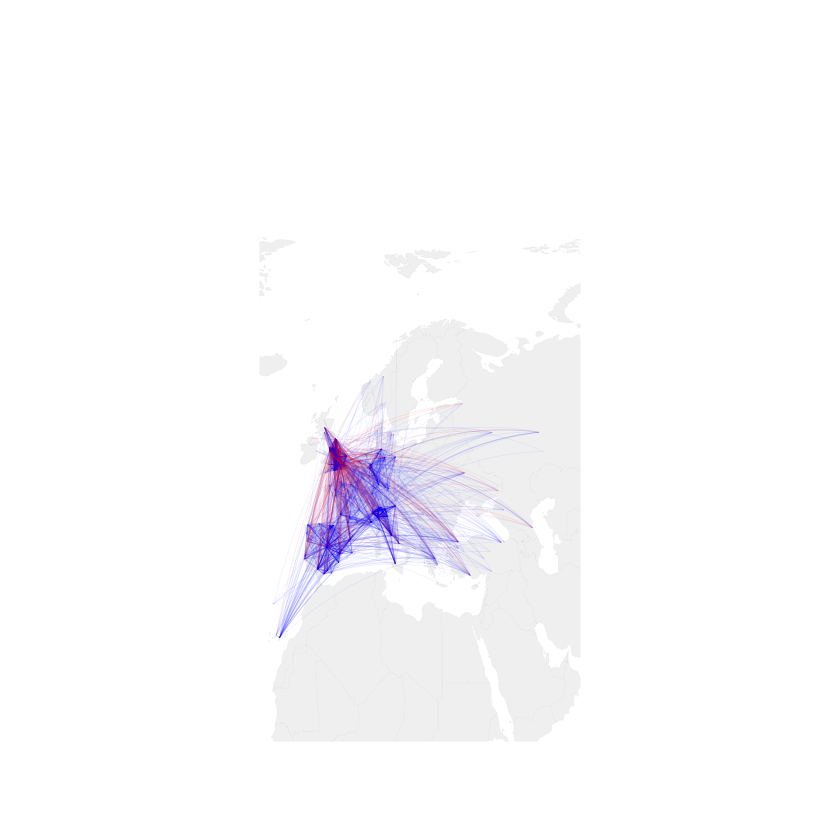

In [328]:
plotmap(data_geo)

# Save it to a PDF for sharing

In [172]:
pdf('/Users/gautamborgohain/Desktop/worldMap_2.pdf')

plotmap(data_geo)
dev.off()

pdf 
  2

## Weighted

# Plotting of the network for which we have the transfer values into a map. The edges are weighted with the transfer values

In [484]:
plotmap2 = function (data_geo){
    xlim = c(-20, 59)
    ylim = c(15, 100)`a

    map("world", col="white", fill=TRUE, bg="white", lwd=0.02,xlim = xlim,ylim = ylim)

    meanVal = mean(data_geo$Trans_Value)
    for(i in 1:nrow(data_geo)){
        inter <- gcIntermediate(c(data_geo[i,"From_lon"],data_geo[i,"From_lat"]), c(data_geo[i,"To_lon"],data_geo[i,"To_lat"]), n=100, addStartEnd=TRUE)

        lines(inter,col=adjustcolor("red",alpha.f = 0.5),lwd=round((data_geo[i,'Trans_Value']/(meanVal*3))),type = 'l')

    }
}

In [480]:
df_paid_geo = data_geo[data_geo$ISPAID == 1,]
df_paid_geo = df_paid_geo[complete.cases(df_paid_geo[c('From_lon','From_lat','To_lon','To_lat','Trans_Value')]),]
df_paid_geo$Trans_Value = as.numeric(as.character(df_paid_geo$Trans_Value))

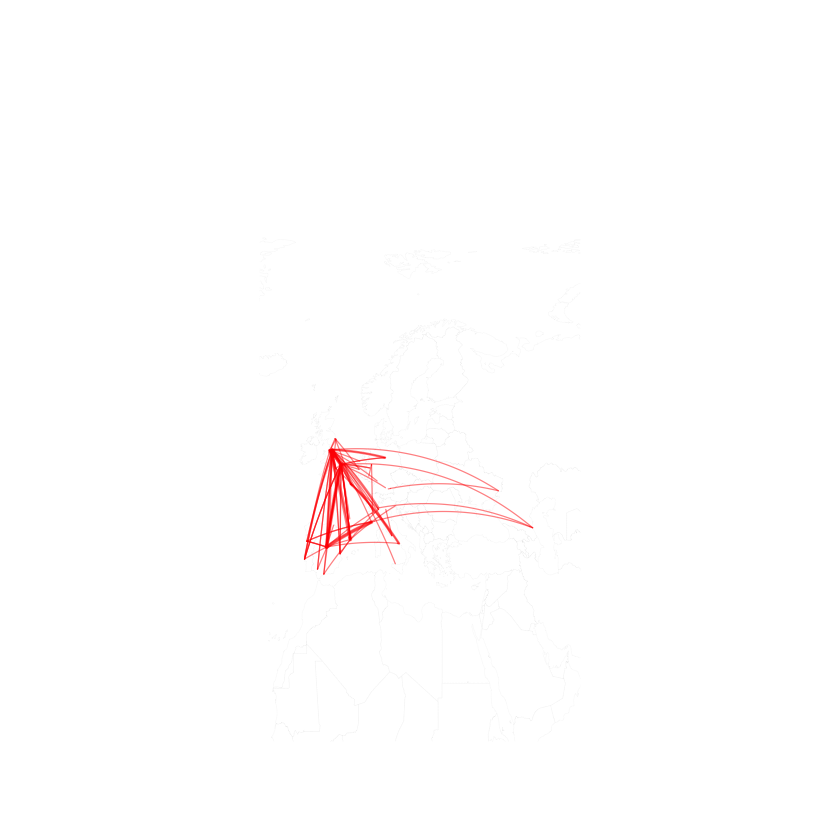

In [485]:
plotmap2(df_paid_geo)

In [486]:
pdf('/Users/gautamborgohain/Desktop/worldMap_weighted.pdf')

plotmap2(df_paid_geo)
dev.off()

pdf 
  2